In [ ]:
!pip uninstall neptune-client

# Предиктор результатов футбольных матчей

In [1]:
#importing
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from seaborn import heatmap

# import optuna

# import neptune
# import neptune.integrations.optuna as optuna_utils

from sklearnex import patch_sklearn # эти строки должны идти перед импортом sklearn
patch_sklearn()                     # для ускорения работы

from catboost import CatBoostClassifier, Pool, metrics

from sklearn.model_selection    import train_test_split
from sklearn.metrics            import accuracy_score#, roc_auc_score, RocCurveDisplay, auc, roc_curve
from sklearn.linear_model       import LogisticRegression
from sklearn.preprocessing      import StandardScaler#, LabelBinarizer
from sklearn.tree               import DecisionTreeClassifier
from sklearn.ensemble           import RandomForestClassifier
# from sklearn.inspection         import permutation_importance



# import shap

# from itertools import cycle
# import joblib

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [5]:
from sklearn.externals import joblib
joblib.load(TYPE_FILEPATH)

ImportError: cannot import name 'joblib' from 'sklearn.externals' (C:\Users\Artyom\anaconda3\envs\football\Lib\site-packages\sklearn\externals\__init__.py)

In [2]:
n_jobs = -1
random_state = 42
data_name = "data_short"

## Обзор данных

In [5]:
data = pd.read_csv(data_name + ".csv")
data.head()

,idmatch,odds_open_win1,odds_open_draw,odds_open_win2,vi_win_home,vi_win_away,vi_nolose_home,vi_nolose_away,vi_over25_home,vi_over25_away,...,team2_away_xgpower_draw_xga90index,team2_away_xgpower_draw_xgsubxgaindex,team2_away_xgpower_03_xg_xg90index,team2_away_xgpower_03_xg_xga90index,team2_away_xgpower_03_xg_xgsubxgaindex,team2_away_xgpower_03_draw_xg90index,team2_away_xgpower_03_draw_xga90index,team2_away_xgpower_03_draw_xgsubxgaindex,result_finish_match,result_total_match
0,39231,2.53,3.15,3.02,2.255,-4.318,19.259,-3.855,-41.798,-10.410,...,1.02,0.32,0.65,1.78,0.36,0.40,0.98,0.40,2.0,0.0
1,39232,2.16,3.26,3.66,-13.230,-29.496,4.164,-47.122,-43.926,-4.662,...,1.04,0.29,0.81,0.88,0.92,0.44,1.23,0.36,1.0,0.0
2,39233,2.35,3.16,3.31,-35.270,-1.048,-17.721,-2.781,8.467,-6.808,...,0.85,0.23,0.24,0.67,0.35,0.27,0.87,0.31,3.0,1.0
3,39235,2.50,3.25,2.97,17.593,27.970,1.079,10.260,-27.452,-23.279,...,3.63,0.02,0.42,0.75,0.56,0.10,1.99,0.05,3.0,1.0
4,45425,2.15,3.49,3.46,19.656,-22.231,-8.999,-8.685,7.560,-7.321,...,0.57,2.14,1.12,1.67,0.67,0.93,0.64,1.45,1.0,1.0


In [6]:
with open("raw_data_info.txt", mode='w') as df_info:
    data.info(verbose=True, show_counts=True, buf=df_info)
print('\nБаланс классов\n')
print(data['result_finish_match'].value_counts(), '\n')
print(data['result_total_match'].value_counts())


Баланс классов

result_finish_match
1.0    24763
3.0    17585
2.0    15099
Name: count, dtype: int64 

result_total_match
0.0    29307
1.0    28140
Name: count, dtype: int64


А если поставить фильтр `selection`:

In [19]:
# boarder_finish = 2.6
# boarder_total  = 1.8
# selection_finish = (data["odds_open_win2"] > boarder_finish) & (data["odds_open_win1"] > boarder_finish)
# selection_total  = (data["odds_open_tm25"] > boarder_total)  & (data["odds_open_tb25"] > boarder_total)
# print(data['result_finish_match'][selection_finish].value_counts(), '\n')
# print(data['result_total_match'][selection_total].value_counts())

Классы более или менее сбалансированны.

# Предобработка

Удаляем строки, в которых пропущен хотя бы один столбец из `"odds_open_win1", "odds_open_draw", "odds_open_win2"`. Оставшиеся пропуски заменяме медианными по столбцам значениями.

In [7]:
data.dropna(inplace=True, subset=["odds_open_win1", "odds_open_draw", "odds_open_win2"])
data.fillna(data.median(axis=0), inplace=True)

assert np.all(data.notna())

## Понижение размерности
Посмотрим на матрицу корреляций *(картинка только для уменьшенного датасета)*:

<Axes: >

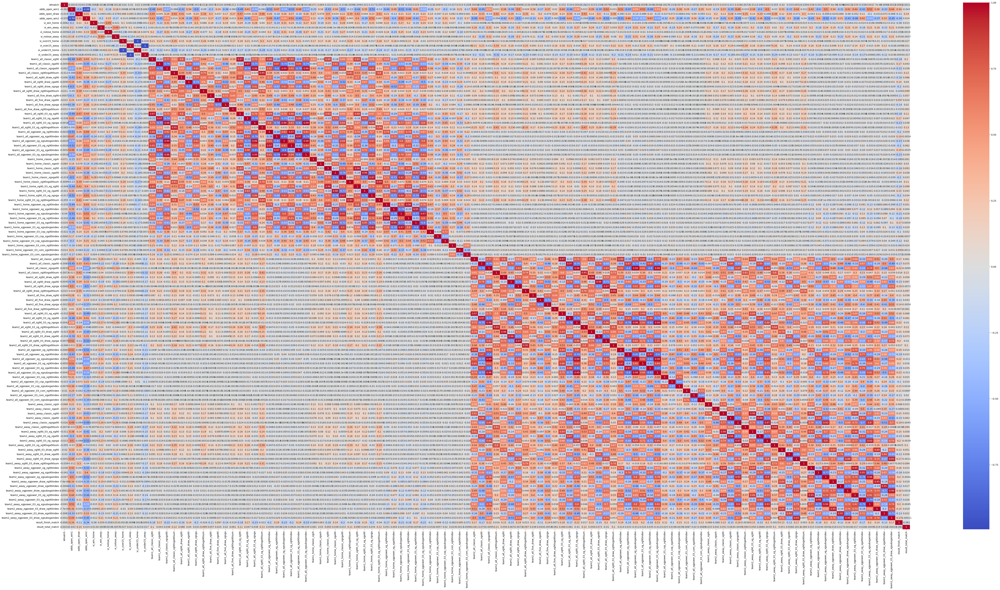

In [21]:
# plt.figure(figsize=(80, 40))

corr_mx = data.corr(method='spearman')
# heatmap(corr_mx, annot=True,  cmap="coolwarm")

Имеет смысл среди всех групп столбцов, для которых коэффициент корреляции по модулю превосходит 0.95, оставить только по одному:

Новый размер массива:  (56860, 81)


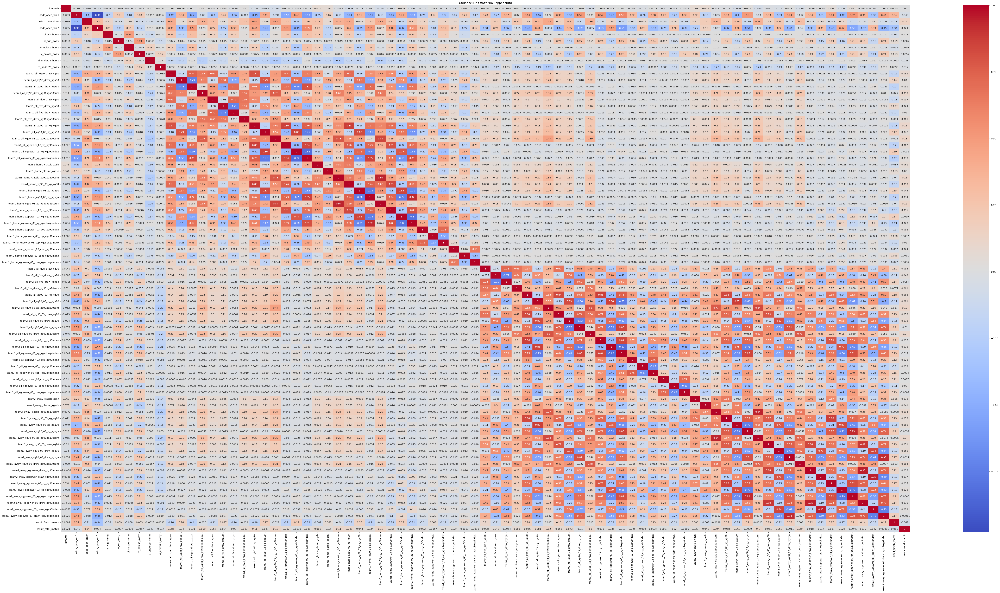

In [22]:
boarder = 0.95
excludable = []

# пробегаем по нижнему треугольнику:
for row in range(4, data.shape[1]): 
    for column in range(1, row):
        if abs(corr_mx.iloc[row, column]) >= boarder:
            excludable.append(data.columns[column])

# удаляем и сохраняем:
data_cut = data.drop(columns=excludable,    inplace=False)
print("Новый размер массива: ", data_cut.shape)
data_cut.to_csv(data_name + "_cut.csv")

# смотрим на обновлённую матрицу корреляций
corr_mx_cut = corr_mx.drop(columns=excludable, inplace=False)
corr_mx_cut.drop(index=excludable,             inplace=True)

# plt.figure(figsize=(80, 40))
# heatmap(corr_mx_cut, annot=True,  cmap="coolwarm")
# plt.title("Обновлённая матрица корреляций");

Исчезли ярко-красные ячейки (*картинка только для уменьшенного датасета*).

In [2]:
data_name = "data_cut.csv"
data = pd.read_csv(data_name, index_col=0)

y = data['result_finish_match'].astype(int) 
# y = data['result_total_match'].astype(int) 
X = data.drop(['result_finish_match', 'result_total_match'], axis=1)
X.iloc[1:, :].astype('float32', copy=False);

In [9]:
data.head()

,idmatch,odds_open_win1,odds_open_draw,odds_open_win2,vi_win_home,vi_win_away,vi_nolose_home,vi_nolose_away,vi_under25_home,vi_under25_away,...,team2_away_xgpower_draw_xg90index,team2_away_xgpower_draw_xga90index,team2_away_xgpower_03_xg_xg90index,team2_away_xgpower_03_xg_xga90index,team2_away_xgpower_03_xg_xgsubxgaindex,team2_away_xgpower_03_draw_xg90index,team2_away_xgpower_03_draw_xga90index,team2_away_xgpower_03_draw_xgsubxgaindex,result_finish_match,result_total_match
0,39231,2.53,3.15,3.02,2.255,-4.318,19.259,-3.855,36.503,5.561,...,0.33,1.02,0.65,1.78,0.36,0.40,0.98,0.40,2.0,0.0
1,39232,2.16,3.26,3.66,-13.230,-29.496,4.164,-47.122,39.021,-1.211,...,0.30,1.04,0.81,0.88,0.92,0.44,1.23,0.36,1.0,0.0
2,39233,2.35,3.16,3.31,-35.270,-1.048,-17.721,-2.781,-13.651,1.255,...,0.20,0.85,0.24,0.67,0.35,0.27,0.87,0.31,3.0,1.0
3,39235,2.50,3.25,2.97,17.593,27.970,1.079,10.260,22.716,17.805,...,0.08,3.63,0.42,0.75,0.56,0.10,1.99,0.05,3.0,1.0
4,45425,2.15,3.49,3.46,19.656,-22.231,-8.999,-8.685,-10.910,3.925,...,1.22,0.57,1.12,1.67,0.67,0.93,0.64,1.45,1.0,1.0


# Подбор оптимальной модели

Подбор производится алгоритмом TPE, предоставляемым библиотекой optuna. В вершине дерева будет два кастомных параметра: `selection_train_boarder` и `selection_test_boarder`. В слое ниже семейства следующих моделей: лог. регрессия, решающее дерево, случайный лес и градиентный бустинг. Ещё ниже -- внутренние гиперпараметры моделей.
Метрика `accuracy` считается с применением кросс-валидации над всем дата-сетом.

## Optuna objective
Напишем собственный алгоритм кросс-валидации.

In [16]:
def instantiate_estimator(trial):

    global n_jobs

    classifier_name = trial.suggest_categorical("classifier", ["LogReg", "Tree", "Forest", "Catboost"])

    is_catboost = False

    if classifier_name == "LogReg":

        estimator = LogisticRegression( 
            C       =trial.suggest_float("LogReg_C",        1e-7, 1e2,  log=True),
            l1_ratio=trial.suggest_float("LogReg_l1_ratio", 0.0,  1.0, log=False),
            penalty='elasticnet',
            solver='saga',
            n_jobs=n_jobs, 
            random_state=random_state
        )

    elif classifier_name == "Tree":

        estimator = DecisionTreeClassifier(
            max_depth        =trial.suggest_int("tree_max_depth",      4,   10,   step=1), 
            min_samples_split=trial.suggest_int("tree_min_to_split",   500, 4000, step=200), 
            criterion=trial.suggest_categorical("tree_criterion", ["gini", "log_loss"]),
            random_state=random_state
        )

    elif classifier_name == "Forest":

        estimator = RandomForestClassifier(
            min_samples_leaf=trial.suggest_int("forest_min_in_leaf", 50, 2000, log=True), 
            criterion=trial.suggest_categorical("forest_criterion", ["gini", "log_loss"]),
            n_estimators=300, 
            bootstrap=False,
            n_jobs=n_jobs, 
            max_features='log2',
            random_state=random_state
        )

    elif classifier_name == "Catboost":

        is_catboost = True

        bootstrap_type      = trial.suggest_categorical("CB_bootstrap", ['No', 'Bernoulli'])
        if bootstrap_type == 'Bernoulli':
            bagging_temperature = trial.suggest_float("CB_bagging_temperature", 1e-1, 1000.0, log=True)
        else:
            bagging_temperature = 1
        
        estimator=CatBoostClassifier(
            learning_rate=trial.suggest_float('CB_lr', 0.01, 0.07),
            bootstrap_type=bootstrap_type,
            bagging_temperature=bagging_temperature,
            min_data_in_leaf=trial.suggest_int("CB_min_in_leaf", 500, 5000, log=True),
            iterations=10000,
            boosting_type='Plain',
            loss_function="MultiClass",
            use_best_model=True,
            eval_metric=metrics.Accuracy(),
            verbose=False,
            early_stopping_rounds=250,
            thread_count=n_jobs
        )
    
    return estimator, is_catboost


def cv_iteration(X, y, selection_test_boarder, estimator, is_catboost, metrics=accuracy_score):

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42, shuffle=True, stratify=y)

    selection_test = (X_test["odds_open_win2"] > selection_test_boarder) & \
                     (X_test["odds_open_win1"] > selection_test_boarder)

    # всё, что не должно войти в тест - обратно в трейн, чтобы не терять данные:
    X_train = pd.concat([X_train, X_test[~selection_test]], copy=False)    
    y_train = pd.concat([y_train, y_test[~selection_test]], copy=False) 

    # Применяем фильтр `selection_test` к X_test
    X_test, y_test = X_test[selection_test], y_test[selection_test]
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train, y_train)
    X_test  = scaler.transform(X_test)

    if is_catboost:
        estimator.fit(
            Pool(X_train, y_train),
            eval_set=Pool(X_test,  y_test)
        )
    else:
        estimator.fit(X_train, y_train)

    return accuracy_score(y_test, estimator.predict(X_test))


def objective(trial):

    global data, X, y, n_jobs
    # критерии отбора в трейн и в тест
    selection_train_boarder = 2.6 #trial.suggest_float('selection_train_boarder', 2.0,                     2.6, step=0.1)
    selection_test_boarder  = 2.6 #trial.suggest_float('selection_test_boarder',  selection_train_boarder, 3.0, step=0.1)    # выбирается число не меньше пограничного  
                                                                                                                        # отбора в трейн и не более 3.0
    selection_train = (data["odds_open_win2"] > selection_train_boarder) & \
                      (data["odds_open_win1"] > selection_train_boarder)
    
    X_obj, y_obj = X[selection_train], y[selection_train]

    estimator, is_catboost = instantiate_estimator(trial)

    cv = 1
    sum_scores = 0
    print('-----------------------------------------------------------------------')
    print(estimator)
    for i in range(cv):
        sum_scores += cv_iteration(X_obj, y_obj, selection_test_boarder, estimator, is_catboost)

    return sum_scores / cv

Подключение к Neptune:

In [17]:
import os

In [18]:
from getpass import getpass

run = neptune.init_run(
    project="helloginov/football-predictor",
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJjOTVmNzA4Ni05ODgwLTQxMGYtYWViMy1hMjYxNzU2MjNlOTIifQ==",
)

neptune_callback = optuna_utils.NeptuneCallback(run)

study = optuna.create_study(direction="maximize")
optuna.logging.set_verbosity(optuna.logging.WARNING)
study.optimize(objective, n_trials=5, callbacks=[neptune_callback])

run.stop()

C:\Users\Artyom\anaconda3\envs\football\Lib\site-packages\neptune\internal\utils\git.py:71: UserWarning: GitPython could not be initialized
  warnings.warn("GitPython could not be initialized")


https://app.neptune.ai/helloginov/football-predictor/e/FOOTBALL-42
-----------------------------------------------------------------------
RandomForestClassifier(bootstrap=False, max_features='log2',
                       min_samples_leaf=1091, n_estimators=300, n_jobs=-1,
                       random_state=42)


[W 2023-09-09 18:46:20,977] Param forest_criterion unique value length is less than 2.
[W 2023-09-09 18:46:20,983] Param forest_min_in_leaf unique value length is less than 2.
[W 2023-09-09 18:46:20,983] Param classifier unique value length is less than 2.
[W 2023-09-09 18:46:20,983] Param forest_min_in_leaf unique value length is less than 2.
[W 2023-09-09 18:46:20,983] Param classifier unique value length is less than 2.
[W 2023-09-09 18:46:20,987] Param forest_criterion unique value length is less than 2.


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\Artyom\\football_predictor.git\\target_finish\\.neptune\\async\\run__9a17e642-e8ef-4d25-9913-f1f3e877ff56\\exec-1694274379.947939-2023-09-09_18.46.19.947939-17404\\upload_path\\visualizations_plot_parallel_coordinate-1694274381.668523-2023-09-09_18.46.21.668523.html'